# Introduction
The degradation and failure prediction of complex mechanical systems, such as aircraft engines, is a critical component of predictive maintenance. Accurate estimation of Remaining Useful Life (RUL) enables timely maintenance, reduces downtime, and enhances operational safety and efficiency.

In this notebook, we explore deep learning-based time series models for RUL prediction using the *CMAPSS FD001* dataset provided by NASA. This subset of the CMAPSS dataset contains data from engines operating under a single consistent operating condition with one fault mode, making it ideal for benchmarking time series models.

We implement and compare two powerful recurrent neural network architectures — Long Short-Term Memory (LSTM) and Gated Recurrent Unit (GRU) — to evaluate their effectiveness in capturing the temporal dependencies and predicting RUL. The models are trained, validated, and tested, and their performance is compared using standard regression metrics such as RMSE, MAE, and MSE.

Importing the Dependenciens

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import random

In [ ]:
random_state = 42

tf.config.experimental.enable_op_determinism()
tf.keras.utils.set_random_seed(random_state)

Loading the data

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
train_FD001 = pd.read_csv("/content/drive/MyDrive/CMAPSS_Data/train_FD001.txt",sep=" ",header=None)

test_FD001 = pd.read_csv("/content/drive/MyDrive/CMAPSS_Data/test_FD001.txt",sep=" ",header=None)

RUL_FD001 = pd.read_csv("/content/drive/MyDrive/CMAPSS_Data/RUL_FD001.txt", header=None)

In [ ]:
#Adding sensors name and unit measure from the paper
columns = ['unit_number','time_(cycles)','operational_setting_1','operational_setting_2','operational_setting_3','T2_Total_temperature_at_fan_inlet_(°R)','T24_Total_temperature_at_LPC_outlet_(°R)','T30_Total_temperature_at_HPC_outlet_(°R)','T50_Total_temperature_at_LPT_outlet_(°R)','P2_Pressure_at_fan_inlet_(psia)','P15_Total_pressure_in_bypass-duct_(psia)','P30_Total_pressure_at_HPC_outlet_(psia)','Nf_Physical_fan_speed_(rpm)',
           'Nc_Physical_core_speed_(rpm)','epr_Engine_pressure_ratio_(P50/P2)','Ps30_Static_pressure_at_HPC_outlet_(psia)','phi_Ratio_of_fuel_flow_to_Ps30_(pps/psi)','NRf_Corrected_fan_speed_(rpm)','NRc_Corrected_core_speed_(rpm)','BPR_Bypass_Ratio','farB_Burner_fuel-air_ratio','htBleed_Bleed_Enthalpy','Nf_dmd_Demanded_fan_speed_(rpm)','PCNfR_dmd_Demanded_corrected_fan_speed_(rpm)','W31_HPT_coolant_bleed_(lbm/s)','W32_LPT_coolant_bleed_(lbm/s)', 26, 27 ]

In [ ]:
train_FD001.columns = columns
test_FD001.columns = columns

In [ ]:
train_FD001.describe()

,unit_number,time_(cycles),operational_setting_1,operational_setting_2,operational_setting_3,T2_Total_temperature_at_fan_inlet_(°R),T24_Total_temperature_at_LPC_outlet_(°R),T30_Total_temperature_at_HPC_outlet_(°R),T50_Total_temperature_at_LPT_outlet_(°R),P2_Pressure_at_fan_inlet_(psia),...,NRc_Corrected_core_speed_(rpm),BPR_Bypass_Ratio,farB_Burner_fuel-air_ratio,htBleed_Bleed_Enthalpy,Nf_dmd_Demanded_fan_speed_(rpm),PCNfR_dmd_Demanded_corrected_fan_speed_(rpm),W31_HPT_coolant_bleed_(lbm/s),W32_LPT_coolant_bleed_(lbm/s),26,27
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,2.063100e+04,20631.000000,20631.000000,20631.000000,2.063100e+04,...,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.0,20631.0,20631.000000,20631.000000,0.0,0.0
mean,51.506568,108.807862,-0.000009,0.000002,100.0,5.186700e+02,642.680934,1590.523119,1408.933782,1.462000e+01,...,8143.752722,8.442146,3.000000e-02,393.210654,2388.0,100.0,38.816271,23.289705,NaN,NaN
std,29.227633,68.880990,0.002187,0.000293,0.0,6.537152e-11,0.500053,6.131150,9.000605,3.394700e-12,...,19.076176,0.037505,1.556432e-14,1.548763,0.0,0.0,0.180746,0.108251,NaN,NaN
min,1.000000,1.000000,-0.008700,-0.000600,100.0,5.186700e+02,641.210000,1571.040000,1382.250000,1.462000e+01,...,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200,NaN,NaN
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,5.186700e+02,642.325000,1586.260000,1402.360000,1.462000e+01,...,8133.245000,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800,NaN,NaN
50%,52.000000,104.000000,0.000000,0.000000,100.0,5.186700e+02,642.640000,1590.100000,1408.040000,1.462000e+01,...,8140.540000,8.438900,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900,NaN,NaN
75%,77.000000,156.000000,0.001500,0.000300,100.0,5.186700e+02,643.000000,1594.380000,1414.555000,1.462000e+01,...,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800,NaN,NaN
max,100.000000,362.000000,0.008700,0.000600,100.0,5.186700e+02,644.530000,1616.910000,1441.490000,1.462000e+01,...,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400,NaN,NaN


In [ ]:
train_FD001.drop(columns=[26,27],inplace=True)
test_FD001.drop(columns=[26,27],inplace=True)

In [ ]:
train_FD001.isnull().sum()

,0
unit_number,0
time_(cycles),0
operational_setting_1,0
operational_setting_2,0
operational_setting_3,0
T2_Total_temperature_at_fan_inlet_(°R),0
T24_Total_temperature_at_LPC_outlet_(°R),0
T30_Total_temperature_at_HPC_outlet_(°R),0
T50_Total_temperature_at_LPT_outlet_(°R),0
P2_Pressure_at_fan_inlet_(psia),0


In [ ]:
train_FD001

,unit_number,time_(cycles),operational_setting_1,operational_setting_2,operational_setting_3,T2_Total_temperature_at_fan_inlet_(°R),T24_Total_temperature_at_LPC_outlet_(°R),T30_Total_temperature_at_HPC_outlet_(°R),T50_Total_temperature_at_LPT_outlet_(°R),P2_Pressure_at_fan_inlet_(psia),...,phi_Ratio_of_fuel_flow_to_Ps30_(pps/psi),NRf_Corrected_fan_speed_(rpm),NRc_Corrected_core_speed_(rpm),BPR_Bypass_Ratio,farB_Burner_fuel-air_ratio,htBleed_Bleed_Enthalpy,Nf_dmd_Demanded_fan_speed_(rpm),PCNfR_dmd_Demanded_corrected_fan_speed_(rpm),W31_HPT_coolant_bleed_(lbm/s),W32_LPT_coolant_bleed_(lbm/s)
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640


In [ ]:
test_FD001

,unit_number,time_(cycles),operational_setting_1,operational_setting_2,operational_setting_3,T2_Total_temperature_at_fan_inlet_(°R),T24_Total_temperature_at_LPC_outlet_(°R),T30_Total_temperature_at_HPC_outlet_(°R),T50_Total_temperature_at_LPT_outlet_(°R),P2_Pressure_at_fan_inlet_(psia),...,phi_Ratio_of_fuel_flow_to_Ps30_(pps/psi),NRf_Corrected_fan_speed_(rpm),NRc_Corrected_core_speed_(rpm),BPR_Bypass_Ratio,farB_Burner_fuel-air_ratio,htBleed_Bleed_Enthalpy,Nf_dmd_Demanded_fan_speed_(rpm),PCNfR_dmd_Demanded_corrected_fan_speed_(rpm),W31_HPT_coolant_bleed_(lbm/s),W32_LPT_coolant_bleed_(lbm/s)
0,1,1,0.0023,0.0003,100.0,518.67,643.02,1585.29,1398.21,14.62,...,521.72,2388.03,8125.55,8.4052,0.03,392,2388,100.0,38.86,23.3735
1,1,2,-0.0027,-0.0003,100.0,518.67,641.71,1588.45,1395.42,14.62,...,522.16,2388.06,8139.62,8.3803,0.03,393,2388,100.0,39.02,23.3916
2,1,3,0.0003,0.0001,100.0,518.67,642.46,1586.94,1401.34,14.62,...,521.97,2388.03,8130.10,8.4441,0.03,393,2388,100.0,39.08,23.4166
3,1,4,0.0042,0.0000,100.0,518.67,642.44,1584.12,1406.42,14.62,...,521.38,2388.05,8132.90,8.3917,0.03,391,2388,100.0,39.00,23.3737
4,1,5,0.0014,0.0000,100.0,518.67,642.51,1587.19,1401.92,14.62,...,522.15,2388.03,8129.54,8.4031,0.03,390,2388,100.0,38.99,23.4130
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13091,100,194,0.0049,0.0000,100.0,518.67,643.24,1599.45,1415.79,14.62,...,520.69,2388.00,8213.28,8.4715,0.03,394,2388,100.0,38.65,23.1974
13092,100,195,-0.0011,-0.0001,100.0,518.67,643.22,1595.69,1422.05,14.62,...,521.05,2388.09,8210.85,8.4512,0.03,395,2388,100.0,38.57,23.2771
13093,100,196,-0.0006,-0.0003,100.0,518.67,643.44,1593.15,1406.82,14.62,...,521.18,2388.04,8217.24,8.4569,0.03,395,2388,100.0,38.62,23.2051
13094,100,197,-0.0038,0.0001,100.0,518.67,643.26,1594.99,1419.36,14.62,...,521.33,2388.08,8220.48,8.4711,0.03,395,2388,100.0,38.66,23.2699


In [ ]:
train_FD001.nunique()

,0
unit_number,100
time_(cycles),362
operational_setting_1,158
operational_setting_2,13
operational_setting_3,1
T2_Total_temperature_at_fan_inlet_(°R),1
T24_Total_temperature_at_LPC_outlet_(°R),310
T30_Total_temperature_at_HPC_outlet_(°R),3012
T50_Total_temperature_at_LPT_outlet_(°R),4051
P2_Pressure_at_fan_inlet_(psia),1


In [ ]:
test_FD001.nunique()

,0
unit_number,100
time_(cycles),303
operational_setting_1,150
operational_setting_2,14
operational_setting_3,1
T2_Total_temperature_at_fan_inlet_(°R),1
T24_Total_temperature_at_LPC_outlet_(°R),262
T30_Total_temperature_at_HPC_outlet_(°R),2361
T50_Total_temperature_at_LPT_outlet_(°R),2954
P2_Pressure_at_fan_inlet_(psia),1


In [ ]:
nu_column = ['operational_setting_3', 'T2_Total_temperature_at_fan_inlet_(°R)', 'P2_Pressure_at_fan_inlet_(psia)', "P15_Total_pressure_in_bypass-duct_(psia)",
            'epr_Engine_pressure_ratio_(P50/P2)', 'farB_Burner_fuel-air_ratio', 'Nf_dmd_Demanded_fan_speed_(rpm)',
            'PCNfR_dmd_Demanded_corrected_fan_speed_(rpm)']

In [ ]:
train_FD001.drop(columns=nu_column, inplace=True)
test_FD001.drop(columns=nu_column, inplace=True)

Adding RUL which is the target of our prediction

In [ ]:
train_FD001['RUL']  = train_FD001.groupby('unit_number')['time_(cycles)'].apply(lambda x: x.max()-x).values

In [ ]:
train_FD001.head()

,unit_number,time_(cycles),operational_setting_1,operational_setting_2,T24_Total_temperature_at_LPC_outlet_(°R),T30_Total_temperature_at_HPC_outlet_(°R),T50_Total_temperature_at_LPT_outlet_(°R),P30_Total_pressure_at_HPC_outlet_(psia),Nf_Physical_fan_speed_(rpm),Nc_Physical_core_speed_(rpm),Ps30_Static_pressure_at_HPC_outlet_(psia),phi_Ratio_of_fuel_flow_to_Ps30_(pps/psi),NRf_Corrected_fan_speed_(rpm),NRc_Corrected_core_speed_(rpm),BPR_Bypass_Ratio,htBleed_Bleed_Enthalpy,W31_HPT_coolant_bleed_(lbm/s),W32_LPT_coolant_bleed_(lbm/s),RUL
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190,191
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236,190
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442,189
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044,187


# **EDA**

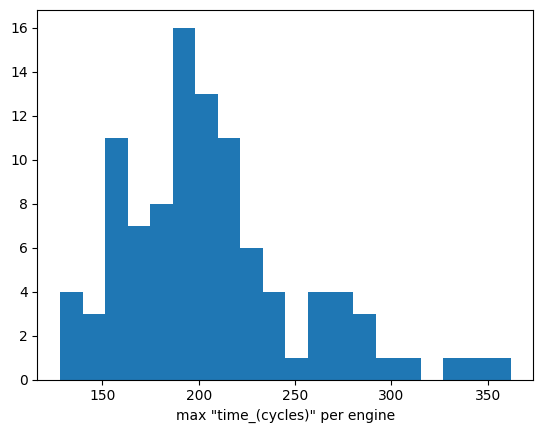

In [ ]:
#Distribution of time cycles per engine
plt.hist(x = train_FD001[["unit_number", "time_(cycles)"]].groupby("unit_number").max()['time_(cycles)'], bins=20)
plt.xlabel('max "time_(cycles)" per engine')
plt.show()

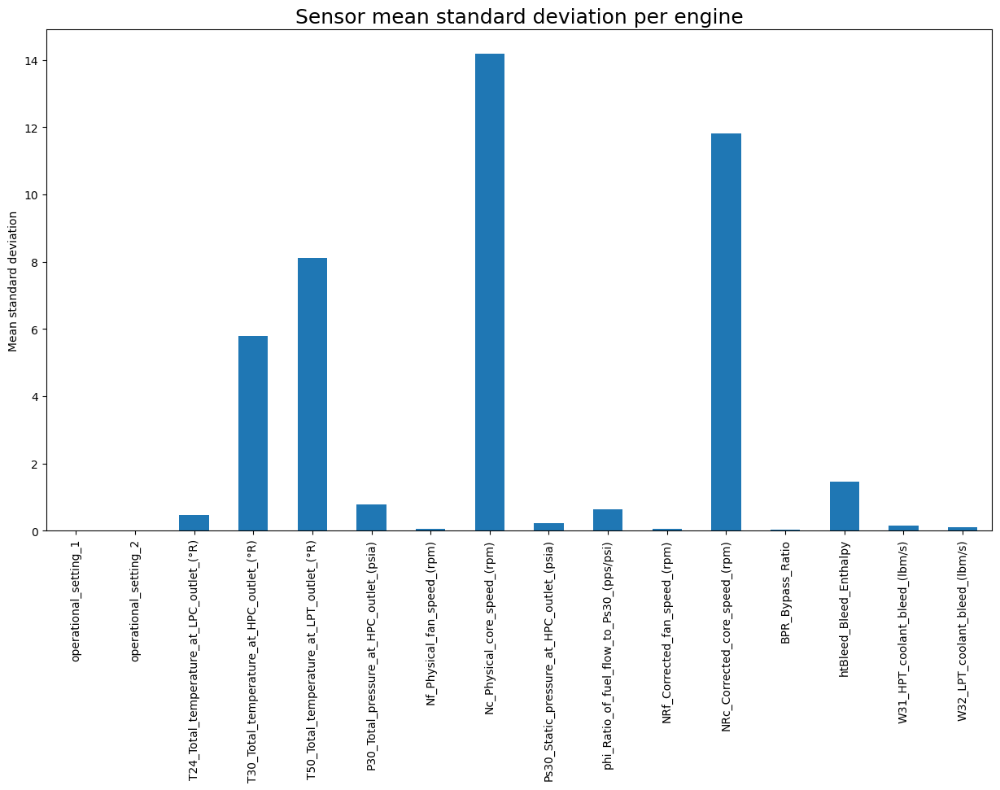

In [ ]:
#Checking the mean variability for sensors per engine
std_sensors = train_FD001.drop(["RUL", "time_(cycles)"], axis=1).groupby("unit_number").std().mean()
ax = std_sensors.plot.bar(figsize=(15,8))
ax.set_title("Sensor mean standard deviation per engine", fontsize=18)
ax.set_ylabel("Mean standard deviation")
plt.show()

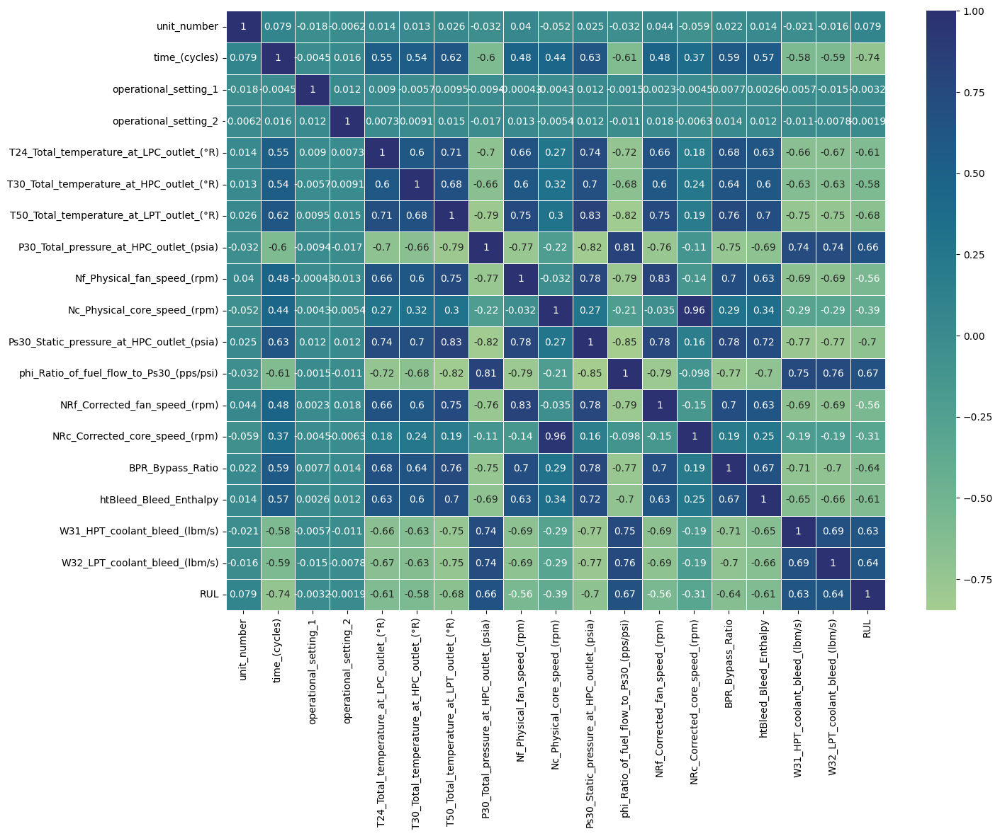

In [ ]:
#Correlation matrix
sns.heatmap(train_FD001.corr(),annot=True,cmap="crest",linewidths=.5)
fig=plt.gcf()
fig.set_size_inches(15,11)
plt.show()

### Since we can observe that "NRc_Corrected_core_speed_(rpm)" and "Nc_Physical_core_speed_(rpm)" are linearly correlated by a value greater than 0.95, we can drop one of them

In [ ]:
train_FD001.drop("NRc_Corrected_core_speed_(rpm)", axis=1, inplace=True)
test_FD001.drop("NRc_Corrected_core_speed_(rpm)", axis=1, inplace=True)

# Data Preprocessing

In [ ]:
def LSTM_preprocessing(data, feature_to_split, target, window_size = 30, feature_to_drop=[], Ceil_RUL=None, shift = 1):
    """
    A preprocessing function for generating LSTM 3D data input, where output first dimension is the number of batches to be made from data, second dimension is window size (timesteps),
    and the third dimension is the number of features.

    input:
    - data: array, data to process in windows (DataFrame)
    - feature_to_split: the name of the single feature which elements are used for selecting rows to split in windows (list/str/int)
    - target: the column of data which is the target of prediction (series)
    - window_size: the size of the window we want for the LSTM (int)
    - feature_to_drop: self explanatory, could be the feature_to_split (list)
    - Ceil_RUL: if int, the max RUL we want, will change all greater RULs to it (int)
    - shift: distance between a window and another. Data will repeat if shift < window_size (int)

    output: an 3D ndarray which is divided in windows
    """
    assert feature_to_split in data.columns , f"feature_to_split not in data features"
    assert type(feature_to_drop) == list , f"feature_to_drop must be a list"

    num_split = np.unique(data[feature_to_split])
    num_features = data.shape[1]-len(feature_to_drop)
    processed_data = np.zeros([0, window_size,num_features])
    processed_target = np.zeros(0)

    for i in num_split:
        data_temp = data[data[feature_to_split] == i].drop(feature_to_drop, axis=1)
        assert len(data_temp) - window_size>0, f"Window size greater than data at unit number: {i}"
        n_batches = (len(data_temp) - window_size)//shift + 1
        singular_output_data = np.zeros([n_batches, window_size,num_features])
        singular_processed_target = np.zeros([n_batches])

        for n_batch in range(len(data_temp) - window_size,-1,-shift):
            n_batches-=1
            singular_output_data[n_batches] = data_temp[n_batch:n_batch+window_size]
            singular_processed_target[n_batches] = target[data[feature_to_split] == i].iloc[n_batch+window_size-1]
        processed_data = np.append(processed_data, singular_output_data, axis=0)
        processed_target = np.append(processed_target, singular_processed_target, axis=0)

    if Ceil_RUL is not None:
        processed_target[processed_target>Ceil_RUL] = Ceil_RUL

    return processed_data, processed_target

In [ ]:
def test_preprocessing(data, feature_to_split, feature_to_drop, window_size = 30):
    """
    A preprocessing function for generating LSTM 3D data input for test, where output first dimension is the number of batches made from data, second dimension is window size (timesteps),
    and the third dimension is the number of features.
    This function will take only the last window data from every feature_to_split in order to make predictions.

    input:
    -data: array, data to process in windows (DataFrame)
    -feature_to_split: the single feature which is used as index, list/str/int
    -feature_to_drop: self explanatory (list)

    output: a 3D array which contains the last window of data for each feature_to_split
    """
    assert(type(feature_to_drop) == list), f"feature_to_drop must be a list"

    num_split = np.unique(data[feature_to_split])
    num_features = data.shape[1]-len(feature_to_drop)
    processed_data = np.zeros([0, window_size,num_features])

    for i in num_split:
        data_temp = data[data[feature_to_split] == i].drop(feature_to_drop, axis=1)
        singular_output_data = np.zeros([1, window_size,num_features])

        singular_output_data[0] = data_temp[-window_size:]

        processed_data = np.append(processed_data, singular_output_data, axis=0)

    return processed_data

In [ ]:
#Standard scale the data, except from categorical numerical columns such as "unit_number", which is re-added after standard scaling. "time_(cycles)" is dropped.
scaler = StandardScaler()

train_scaled = pd.DataFrame(np.c_[train_FD001[["unit_number"]], scaler.fit_transform(train_FD001.drop(["unit_number","time_(cycles)", "RUL"], axis=1))])
test_scaled = pd.DataFrame(np.c_[test_FD001[["unit_number"]], scaler.transform(test_FD001.drop(["unit_number","time_(cycles)"], axis=1))])

Since some engines are affected by initial wear, it is chosen not to include "time_(cycles)" in the features, as some engines could be worn even in the initial state due to manufacturing inefficiencies, as we learn in the paper.

In [ ]:
pd.DataFrame(train_scaled).head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,1.0,-0.315980,-1.372953,-1.721725,-0.134255,-0.925936,1.121141,-0.516338,-0.862813,-0.266467,0.334262,-1.058890,-0.603816,-0.781710,1.348493,1.194427
1,1.0,0.872722,-1.031720,-1.061780,0.211528,-0.643726,0.431930,-0.798093,-0.958818,-0.191583,1.174899,-0.363646,-0.275852,-0.781710,1.016528,1.236922
2,1.0,-1.961874,1.015677,-0.661813,-0.413166,-0.525953,1.008155,-0.234584,-0.557139,-1.015303,1.364721,-0.919841,-0.649144,-2.073094,0.739891,0.503423
3,1.0,0.324090,-0.008022,-0.661813,-1.261314,-0.784831,1.222827,0.188048,-0.713826,-1.539489,1.961302,-0.224597,-1.971665,-0.781710,0.352598,0.777792
4,1.0,-0.864611,-0.690488,-0.621816,-1.251528,-0.301518,0.714393,-0.516338,-0.457059,-0.977861,1.052871,-0.780793,-0.339845,-0.136018,0.463253,1.059552


In [ ]:
print("Minimum window size possible for train: ", train_FD001[["unit_number", "time_(cycles)"]].groupby("unit_number").max().values.min())
print("Minimum window size possible for test: ", test_FD001[["unit_number", "time_(cycles)"]].groupby("unit_number").max().values.min())

Minimum window size possible for train:  128
Minimum window size possible for test:  31


In [ ]:
window_size = 30

#Column 0 is "unit_number", it used to split the data by engine then dropped, as we do not want this feature for prediction
X, y = LSTM_preprocessing(train_scaled, 0, train_FD001['RUL'], window_size, [0], Ceil_RUL=150, shift = 1)

#Manually shuffle the dataset to ensure reproducibility, setting shuffle=false later on the model
np.random.seed(random_state)
shuffled_index = np.random.permutation(len(X))
X, y = X[shuffled_index], y[shuffled_index]

In [ ]:
test_processed = test_preprocessing(test_scaled, 0, [0], window_size=window_size)

In [ ]:
print("X shape: ", X.shape)
print("y shape: ", y.shape)
print("test_processed shape: ", test_processed.shape)
print("RUL_FD001 shape: ", RUL_FD001.shape)

X shape:  (17731, 30, 15)
y shape:  (17731,)
test_processed shape:  (100, 30, 15)
RUL_FD001 shape:  (100, 1)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size = 0.2, random_state = random_state)
#X_test, y_test will be used as validation data
print("X_train shape: ", X_train.shape)
print("X_test shape: ", X_test.shape)
print("y_train shape: ", y_train.shape)
print("y_test shape: ", y_test.shape)

X_train shape:  (14184, 30, 15)
X_test shape:  (3547, 30, 15)
y_train shape:  (14184,)
y_test shape:  (3547,)


# Implementing **LSTM**

In [ ]:
def s_score(RUL_true, RUL_predicted, a1=10, a2=13):
    """
    Input: 1D np.array
    Late prediction (negative diff) are more penalized than early prediction
    The lower the score the better
    """
    diff = np.array(RUL_true) - np.array(RUL_predicted)
    s = sum(np.exp(-diff[diff<0]/a1)-1) + sum(np.exp(diff[diff>=0]/a2)-1)
    return s

In [ ]:
def s_score_model(RUL_true, RUL_predicted, a1=10, a2=13):
    """
    Input: 1D tf.tensor
    Late prediction (negative diff) are more penalized than early prediction
    """
    diff = tf.subtract(RUL_true,RUL_predicted)
    s = tf.reduce_sum(tf.where(diff < 0, tf.exp(-diff/a1)-1, tf.exp(diff/a2)-1), axis=0)
    return s

The s-score is defined with parameters 'a1' and 'a2' set to penalize late prediction over early prediction. It is used since it is the preferred metric of performance described in the reference paper for RUL prediction. As a reference metric mse will also be shown by the model.

To evaluate the predictions, mean squared error, mean average error and mean absolute error.

In [ ]:
initializer = tf.initializers.GlorotNormal(seed=random_state)

model = Sequential([
    layers.LSTM(128, input_shape = (X.shape[1], X.shape[2]), return_sequences=True, activation = "tanh", bias_initializer="ones", kernel_initializer=initializer,
            kernel_regularizer=tf.keras.regularizers.L1L2(l1=1e-5, l2=1e-4),
               ),
    layers.LSTM(64, activation = "tanh", bias_initializer="ones", kernel_initializer=initializer,
            kernel_regularizer=tf.keras.regularizers.L1L2(l1=1e-4, l2=1e-3),
               ),
    layers.Dropout(0.5, seed=random_state),
    layers.Dense(32, activation = "relu", kernel_initializer=initializer,
                ),
    layers.Dense(8, activation = "relu", kernel_initializer=initializer,
                ),
    layers.Dense(1)
])

opt = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss = s_score_model, metrics=["mse"], optimizer = opt)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
history = model.fit(X_train, y_train, epochs = 30,
                    validation_data = (X_test, y_test),
                    shuffle = False,
                    batch_size = 96, verbose = 2)

Epoch 1/30
148/148 - 4s - 29ms/step - loss: 539561.9375 - mse: 6023.2769 - val_loss: 39570.1641 - val_mse: 3439.0815
Epoch 2/30
148/148 - 2s - 14ms/step - loss: 23956.1504 - mse: 2774.8599 - val_loss: 8362.4541 - val_mse: 1915.3398
Epoch 3/30
148/148 - 3s - 20ms/step - loss: 7440.2051 - mse: 1671.8590 - val_loss: 3351.1460 - val_mse: 1294.2744
Epoch 4/30
148/148 - 1s - 10ms/step - loss: 3862.6843 - mse: 1232.0397 - val_loss: 1964.2701 - val_mse: 981.1120
Epoch 5/30
148/148 - 1s - 8ms/step - loss: 2869.5129 - mse: 1047.3875 - val_loss: 1405.0780 - val_mse: 822.4464
Epoch 6/30
148/148 - 1s - 8ms/step - loss: 2233.7883 - mse: 905.2896 - val_loss: 1176.9519 - val_mse: 711.8419
Epoch 7/30
148/148 - 1s - 8ms/step - loss: 1907.4629 - mse: 814.4774 - val_loss: 996.0466 - val_mse: 612.6907
Epoch 8/30
148/148 - 1s - 9ms/step - loss: 1783.6920 - mse: 761.8881 - val_loss: 820.1044 - val_mse: 566.3820
Epoch 9/30
148/148 - 1s - 8ms/step - loss: 1578.0973 - mse: 716.3405 - val_loss: 749.6102 - val_ms

# Model Evaluation

In [ ]:
RUL_predicted = model.predict(test_processed)

MSE = mean_squared_error(RUL_FD001, RUL_predicted)
MAE = np.abs(RUL_FD001 - RUL_predicted).values.mean()
std_AE = np.abs(RUL_FD001 - RUL_predicted).values.std()
print("MSE: ", MSE)
print("RMSE: ", np.sqrt(MSE).round(2))
print("MAE: ", MAE.round(2))
print("std_AE: ", std_AE.round(2))
print("s_score: ", s_score(RUL_FD001, RUL_predicted).round(2))

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
MSE:  242.33920288085938
RMSE:  15.57
MAE:  11.26
std_AE:  10.75
s_score:  403.7


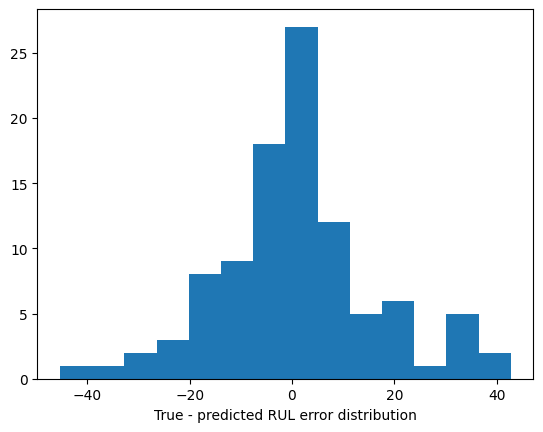

In [ ]:
diff = np.array(RUL_FD001-RUL_predicted)
plt.hist(diff, bins='auto')
plt.xlabel("True - predicted RUL error distribution")
plt.show()

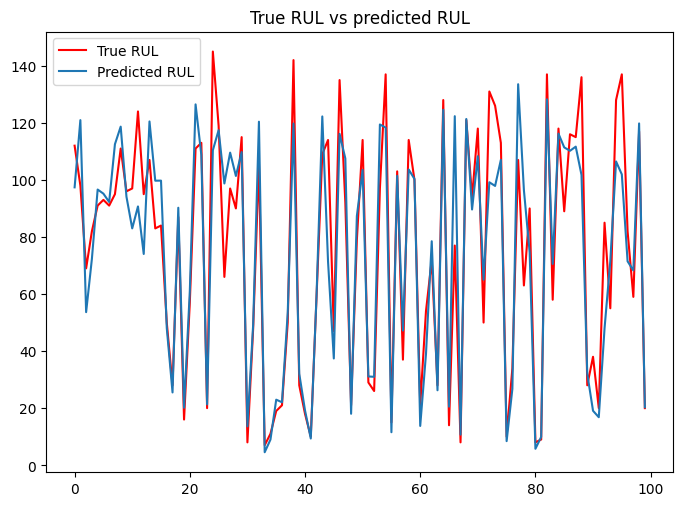

In [ ]:
#True RUL vs predicted RUL
fig, axes = plt.subplots(1, figsize = (7,5))
fig.tight_layout()
axes.plot(RUL_FD001, label = "True RUL", color = "red")
axes.plot(RUL_predicted, label = "Predicted RUL")
axes.set_title("True RUL vs predicted RUL")
axes.legend()
plt.show()

In [ ]:
tf.keras.models.save_model(model, "FD001_LSTM_s-score_"+ str(s_score(RUL_FD001, RUL_predicted).round(2)) + ".keras")

# Implementing **GRU**


In [15]:
# Importing Libraries
import numpy as np
import pandas as pd

from IPython.display import display, HTML
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio


import seaborn as sns
from importlib import reload
import matplotlib.pyplot as plt
import matplotlib
import warnings

reload(plt)
%matplotlib inline
%config InlineBackend.figure_format ='retina'

warnings.filterwarnings('ignore')

# configure plotly graph objects
pio.renderers.default = 'iframe'

pio.templates["ck_template"] = go.layout.Template(
    layout_colorway = px.colors.sequential.Viridis,
    layout_autosize=False,
    layout_width=800,
    layout_height=600,
    layout_font = dict(family="Calibri Light"),
    layout_title_font = dict(family="Calibri"),
    layout_hoverlabel_font = dict(family="Calibri Light"),
)

pio.templates.default = 'ck_template+gridon'

In [3]:
# Giving names to the features
index_names = ['engine', 'cycle']
setting_names = ['setting_1', 'setting_2', 'setting_3']
sensor_names=[ "(Fan inlet temperature) (◦R)",
"(LPC outlet temperature) (◦R)",
"(HPC outlet temperature) (◦R)",
"(LPT outlet temperature) (◦R)",
"(Fan inlet Pressure) (psia)",
"(bypass-duct pressure) (psia)",
"(HPC outlet pressure) (psia)",
"(Physical fan speed) (rpm)",
"(Physical core speed) (rpm)",
"(Engine pressure ratio(P50/P2)",
"(HPC outlet Static pressure) (psia)",
"(Ratio of fuel flow to Ps30) (pps/psia)",
"(Corrected fan speed) (rpm)",
"(Corrected core speed) (rpm)",
"(Bypass Ratio) ",
"(Burner fuel-air ratio)",
"(Bleed Enthalpy)",
"(Required fan speed)",
"(Required fan conversion speed)",
"(High-pressure turbines Cool air flow)",
"(Low-pressure turbines Cool air flow)" ]
col_names = index_names + setting_names + sensor_names

df_train = pd.read_csv(('/content/drive/MyDrive/CMAPSS_Data/train_FD001.txt'), sep='\s+', header=None, names=col_names)
df_test = pd.read_csv(('/content/drive/MyDrive/CMAPSS_Data/test_FD001.txt'), sep='\s+', header=None, names=col_names)
df_test_RUL = pd.read_csv(('/content/drive/MyDrive/CMAPSS_Data/RUL_FD001.txt'), sep='\s+', header=None, names=['RUL'])

In [6]:
df_train.head()

,engine,cycle,setting_1,setting_2,setting_3,(Fan inlet temperature) (◦R),(LPC outlet temperature) (◦R),(HPC outlet temperature) (◦R),(LPT outlet temperature) (◦R),(Fan inlet Pressure) (psia),...,(Ratio of fuel flow to Ps30) (pps/psia),(Corrected fan speed) (rpm),(Corrected core speed) (rpm),(Bypass Ratio),(Burner fuel-air ratio),(Bleed Enthalpy),(Required fan speed),(Required fan conversion speed),(High-pressure turbines Cool air flow),(Low-pressure turbines Cool air flow)
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [7]:
# drop the sensors wiith constant values
sens_const_values = []
for feature in list(setting_names + sensor_names):
    try:
        if df_train[feature].min()==df_train[feature].max():
            sens_const_values.append(feature)
    except:
        pass

print(sens_const_values)
df_train.drop(sens_const_values,axis=1,inplace=True)
df_test.drop(sens_const_values,axis=1,inplace=True)

['setting_3', '(Fan inlet temperature) (◦R)', '(Fan inlet Pressure) (psia)', '(Engine pressure ratio(P50/P2)', '(Burner fuel-air ratio)', '(Required fan speed)', '(Required fan conversion speed)']


In [8]:
# drop all but one of the highly correlated features
cor_matrix = df_train.corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
corr_features = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95)]
print(corr_features)
df_train.drop(corr_features,axis=1,inplace=True)
df_test.drop(corr_features,axis=1,inplace=True)

['(Corrected core speed) (rpm)']


In [9]:
# Remaining features
list(df_train)

['engine',
 'cycle',
 'setting_1',
 'setting_2',
 '(LPC outlet temperature) (◦R)',
 '(HPC outlet temperature) (◦R)',
 '(LPT outlet temperature) (◦R)',
 '(bypass-duct pressure) (psia)',
 '(HPC outlet pressure) (psia)',
 '(Physical fan speed) (rpm)',
 '(Physical core speed) (rpm)',
 '(HPC outlet Static pressure) (psia)',
 '(Ratio of fuel flow to Ps30) (pps/psia)',
 '(Corrected fan speed) (rpm)',
 '(Bypass Ratio) ',
 '(Bleed Enthalpy)',
 '(High-pressure turbines Cool air flow)',
 '(Low-pressure turbines Cool air flow)']

In [10]:
features = list(df_train.columns)

In [11]:
# define the maximum life of each engine
df_train_RUL = df_train.groupby(['engine']).agg({'cycle':'max'})
df_train_RUL.rename(columns={'cycle':'life'},inplace=True)
df_train_RUL.head()

,life
engine,
1,192
2,287
3,179
4,189
5,269


In [12]:
df_train=df_train.merge(df_train_RUL,how='left',on=['engine'])

In [13]:
df_train['RUL']=df_train['life']-df_train['cycle']
df_train.drop(['life'],axis=1,inplace=True)
df_train['RUL'][df_train['RUL']>125]=125
df_train.head()

<ipython-input-13-0a26cb33821a>:3: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_train['RUL'][df_train['RUL']>125]=125
<ipython-input-13-0a26cb33821a>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

,engine,cycle,setting_1,setting_2,(LPC outlet temperature) (◦R),(HPC outlet temperature) (◦R),(LPT outlet temperature) (◦R),(bypass-duct pressure) (psia),(HPC outlet pressure) (psia),(Physical fan speed) (rpm),(Physical core speed) (rpm),(HPC outlet Static pressure) (psia),(Ratio of fuel flow to Ps30) (pps/psia),(Corrected fan speed) (rpm),(Bypass Ratio),(Bleed Enthalpy),(High-pressure turbines Cool air flow),(Low-pressure turbines Cool air flow),RUL
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,21.61,554.36,2388.06,9046.19,47.47,521.66,2388.02,8.4195,392,39.06,23.4190,125
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,21.61,553.75,2388.04,9044.07,47.49,522.28,2388.07,8.4318,392,39.00,23.4236,125
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,21.61,554.26,2388.08,9052.94,47.27,522.42,2388.03,8.4178,390,38.95,23.3442,125
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,21.61,554.45,2388.11,9049.48,47.13,522.86,2388.08,8.3682,392,38.88,23.3739,125
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,21.61,554.00,2388.06,9055.15,47.28,522.19,2388.04,8.4294,393,38.90,23.4044,125


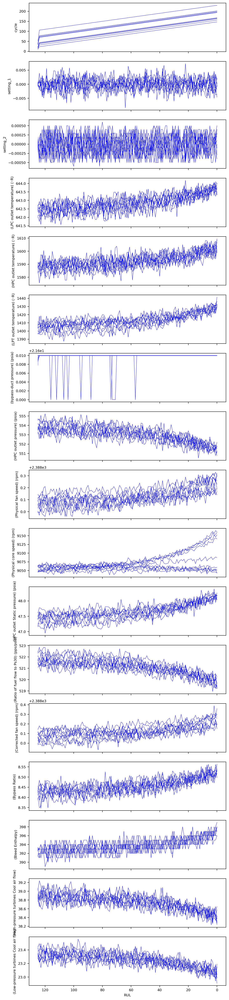

In [21]:

plt.rcParams['figure.figsize']=8,40
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 8
plt.rcParams['lines.linewidth'] = 0.5
plot_items = list(df_train.columns)[1:-1]
fig,ax = plt.subplots(len(plot_items),sharex=True)
ax[0].invert_xaxis()

engines = list(df_train['engine'].unique())

for engine in engines[20:30]:
    for i,item in enumerate(plot_items):
        f = sns.lineplot(data=df_train[df_train['engine']==engine],x='RUL',y=item,color='blue',ax=ax[i],
                        )

In [22]:
from scipy import signal
def smooth_function(x,window=15,order=3):
    return signal.savgol_filter(x,window,order)

In [23]:
for engine in engines:
    for item in sensor_names:
        try:
            df_train[item][df_train['engine']==engine]=smooth_function(df_train[item][df_train['engine']==engine])
            df_test[item][df_test['engine']==engine]=smooth_function(df_test[item][df_test['engine']==engine])
        except:
            pass

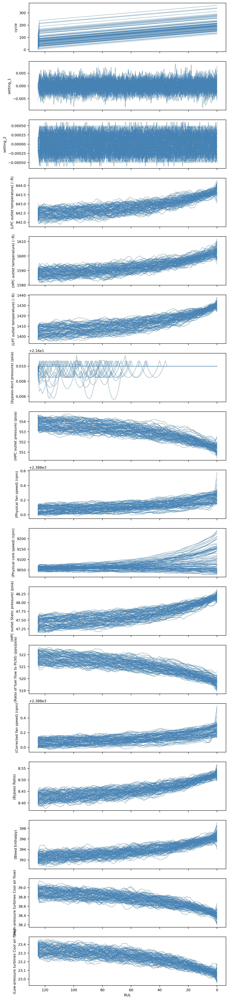

In [24]:
plt.rcParams['figure.figsize']=8,40
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 8
plt.rcParams['lines.linewidth'] = 0.5
plot_items = list(df_train.columns)[1:-1]
fig,ax = plt.subplots(len(plot_items),sharex=True)
ax[0].invert_xaxis()
for engine in engines:
    for i,item in enumerate(plot_items):
        f = sns.lineplot(data=df_train[df_train['engine']==engine],x='RUL',y=item,color='steelblue',ax=ax[i],
                        )

### Perform a statistical univariate test to determine the best features.

In [25]:
# awesome bit of code from https://www.kaggle.com/code/adibouayjan/house-price-step-by-step-modeling

Selected_Features = []
import statsmodels.api as sm

def backward_regression(X, y, initial_list=[], threshold_out=0.05, verbose=True):
    """To select feature with Backward Stepwise Regression

    Args:
        X -- features values
        y -- target variable
        initial_list -- features header
        threshold_out -- pvalue threshold of features to drop
        verbose -- true to produce lots of logging output

    Returns:
        list of selected features for modeling
    """
    included = list(X.columns)
    while True:
        changed = False
        model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max()  # null if pvalues is empty
        if worst_pval > threshold_out:
            changed = True
            worst_feature = pvalues.idxmax()
            included.remove(worst_feature)
            if verbose:
                print(f"worst_feature : {worst_feature}, {worst_pval} ")
        if not changed:
            break
    Selected_Features.append(included)
    print(f"\nSelected Features:\n{Selected_Features[0]}")


# Application of the backward regression function on our training data
X = df_train.iloc[:,1:-1]
y = df_train.iloc[:,-1]
backward_regression(X, y)

worst_feature : setting_1, 0.36453533055996756 
worst_feature : setting_2, 0.2652073218336575 

Selected Features:
['cycle', '(LPC outlet temperature) (◦R)', '(HPC outlet temperature) (◦R)', '(LPT outlet temperature) (◦R)', '(bypass-duct pressure) (psia)', '(HPC outlet pressure) (psia)', '(Physical fan speed) (rpm)', '(Physical core speed) (rpm)', '(HPC outlet Static pressure) (psia)', '(Ratio of fuel flow to Ps30) (pps/psia)', '(Corrected fan speed) (rpm)', '(Bypass Ratio) ', '(Bleed Enthalpy)', '(High-pressure turbines Cool air flow)', '(Low-pressure turbines Cool air flow)']


In [26]:
Selected_Features

[['cycle',
  '(LPC outlet temperature) (◦R)',
  '(HPC outlet temperature) (◦R)',
  '(LPT outlet temperature) (◦R)',
  '(bypass-duct pressure) (psia)',
  '(HPC outlet pressure) (psia)',
  '(Physical fan speed) (rpm)',
  '(Physical core speed) (rpm)',
  '(HPC outlet Static pressure) (psia)',
  '(Ratio of fuel flow to Ps30) (pps/psia)',
  '(Corrected fan speed) (rpm)',
  '(Bypass Ratio) ',
  '(Bleed Enthalpy)',
  '(High-pressure turbines Cool air flow)',
  '(Low-pressure turbines Cool air flow)']]

In [27]:
feature_names = Selected_Features[0]
np.shape(X)

(20631, 17)

In [28]:
len(feature_names)

15

### Model Building

In [30]:
df_test_cycle = df_test.groupby(['engine']).agg({'cycle':'max'})
df_test_cycle.rename(columns={'cycle':'life'},inplace=True)
df_test_max = df_test.merge(df_test_cycle,how='left',on=['engine'])
df_test_max = df_test_max[(df_test_max['cycle']==df_test_max['life'])]
df_test_max.drop(['life'],axis=1,inplace=True)
df_test_max.head(4)

,engine,cycle,setting_1,setting_2,(LPC outlet temperature) (◦R),(HPC outlet temperature) (◦R),(LPT outlet temperature) (◦R),(bypass-duct pressure) (psia),(HPC outlet pressure) (psia),(Physical fan speed) (rpm),(Physical core speed) (rpm),(HPC outlet Static pressure) (psia),(Ratio of fuel flow to Ps30) (pps/psia),(Corrected fan speed) (rpm),(Bypass Ratio),(Bleed Enthalpy),(High-pressure turbines Cool air flow),(Low-pressure turbines Cool air flow)
30,1,31,-0.0006,0.0004,642.691088,1583.147020,1398.508154,21.61,554.282265,2388.072314,9053.360523,47.313363,521.833866,2388.074284,8.403312,392.216013,38.936275,23.374482
79,2,49,0.0018,-0.0001,642.612422,1585.161507,1410.313676,21.61,553.522418,2388.125745,9046.300938,47.565634,521.749222,2388.092134,8.435899,391.468954,38.883863,23.276060
205,3,126,-0.0016,0.0004,642.981333,1587.632137,1416.585346,21.61,552.771389,2388.169317,9048.746971,47.785948,520.611480,2388.168451,8.419369,395.083333,38.840866,23.269471
311,4,106,0.0012,0.0004,642.738608,1594.473536,1406.458373,21.61,553.132824,2388.150013,9053.478408,47.687686,521.624029,2388.135337,8.453135,394.867320,38.628765,23.254686


In [31]:
X_train = df_train[feature_names]
y_train = df_train.iloc[:,-1]
X_test = df_test_max[feature_names]
y_test = df_test_RUL.iloc[:,-1]

In [32]:
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [33]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import GRU, Dense, Bidirectional, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import time
import sklearn.metrics
from sklearn.model_selection import train_test_split
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Split training data for validation
X_train_s, X_val, y_train_s, y_val = train_test_split(X_train, y_train, test_size=0.1)

# Reshape data to 3D
X_train_reshaped = X_train_s.reshape(X_train_s.shape[0], 1, X_train_s.shape[1])
X_val_reshaped   = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
X_test_reshaped  = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])


In [34]:
# Build the improved GRU model
model_gru_improved = Sequential()
# First layer
model_gru_improved.add(Bidirectional(GRU(128, return_sequences=True), input_shape=(1, X_train.shape[1])))
model_gru_improved.add(BatchNormalization())
model_gru_improved.add(Dropout(0.3))

# Second layer
model_gru_improved.add(Bidirectional(GRU(64, return_sequences=False)))
model_gru_improved.add(BatchNormalization())
model_gru_improved.add(Dropout(0.3))

# Dense layers for regression output
model_gru_improved.add(Dense(64, activation='relu'))
model_gru_improved.add(Dropout(0.3))
model_gru_improved.add(Dense(1))

In [35]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1,
                              patience=4, min_lr=1e-7, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True, verbose=1)

# Compile the model
model_gru_improved.compile(loss="mse", optimizer=Adam(learning_rate=0.001))
model_gru_improved.summary()

# Train the improved GRU model
start = time.time()
history = model_gru_improved.fit(x=X_train_reshaped, y=y_train_s,
                                 validation_data=(X_val_reshaped, y_val),
                                 epochs=50,
                                 batch_size=500,
                                 callbacks=[reduce_lr, early_stop])
end_train = time.time()

# Make predictions on the test set
y_predictions = model_gru_improved.predict(X_test_reshaped)
end_predict = time.time()

# Adjust predictions shape
y_predictions = y_predictions[:, 0]

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional (Bidirectional)   │ (None, 1, 256)         │       111,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1, 256)         │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1, 256)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 128)            │       123,648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 244,865 (956.50 KB)

 Trainable params: 244,097 (953.50 KB)

 Non-trainable params: 768 (3.00 KB)

Epoch 1/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 8370.8125 - val_loss: 8977.9336 - learning_rate: 0.0010
Epoch 2/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 4893.7422 - val_loss: 6299.6802 - learning_rate: 0.0010
Epoch 3/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1837.8713 - val_loss: 765.6591 - learning_rate: 0.0010
Epoch 4/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 905.8752 - val_loss: 1216.9758 - learning_rate: 0.0010
Epoch 5/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 665.4177 - val_loss: 1311.9183 - learning_rate: 0.0010
Epoch 6/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 583.8233 - val_loss: 1111.9026 - learning_rate: 0.0010
Epoch 7/50
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 528.1952
Epoch 7: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 527.9070 - val_loss: 868.2511 - learning_rate: 0.0010
Epoch 8/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 507.0753

In [41]:
# Record performance metrics
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

print('GRU Model R-squared error: ' + "{:.2%}".format(r2_score(y_test, y_predictions)))
print('GRU Model RMSE: ' + "{:.2f}".format(np.sqrt(mean_squared_error(y_test, y_predictions))))
print('GRU Model MSE: ' + "{:.2f}".format(mean_squared_error(y_test, y_predictions)))
print('GRU Model MAE: ' + "{:.2f}".format(mean_absolute_error(y_test, y_predictions)))


GRU Model R-squared error: 78.82%
GRU Model RMSE: 19.13
GRU Model MSE: 365.82
GRU Model MAE: 13.91


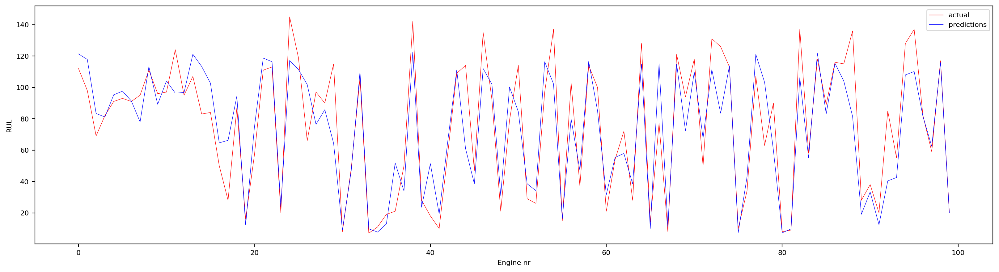

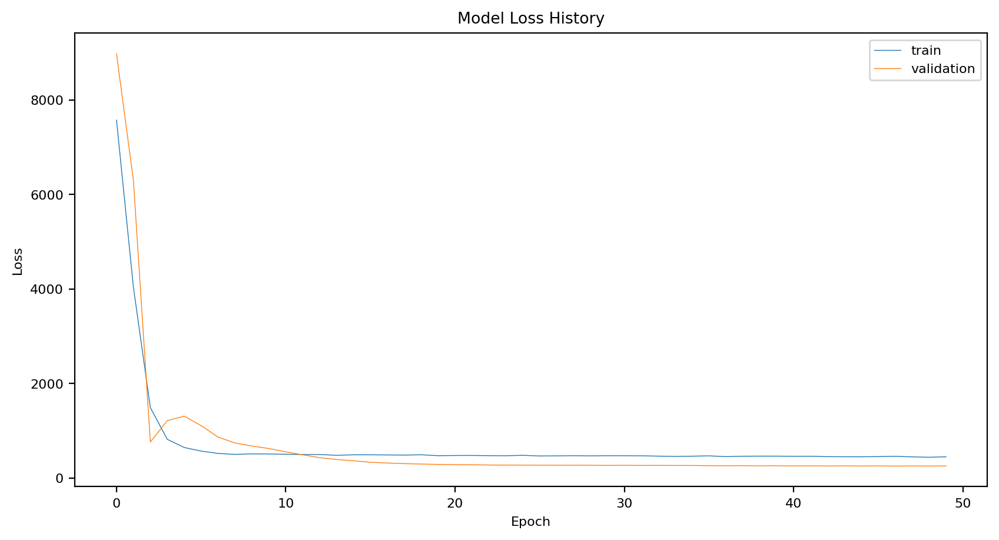

In [43]:
plt.rcParams['figure.figsize'] = (20, 5)
fig, ax = plt.subplots()
plt.ylabel('RUL')
plt.xlabel('Engine nr')
sns.lineplot(x=np.arange(len(np.unique(df_train['engine']))),
             y=y_test, color='red', label='actual', ax=ax)
sns.lineplot(x=np.arange(len(np.unique(df_train['engine']))),
             y=y_predictions, color='blue', label='predictions', ax=ax)
ax.legend()

# Plot model loss history
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='validation')
plt.title('Model Loss History')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

# **Conclusion**

In this notebook, we implemented and evaluated two deep learning models — LSTM and GRU — for predicting the Remaining Useful Life (RUL) of engines using the CMAPSS FD001 dataset.

The models were trained on multivariate time series sensor data and assessed using standard regression metrics: MSE, RMSE, and MAE. The evaluation results are summarized as follows:

*LSTM Model:*

MSE: 242.34

RMSE: 15.57

MAE: 11.26

*GRU Model:*

MSE: 365.82

RMSE: 19.13

MAE: 13.91

The results indicate that the LSTM model outperformed the GRU model across all evaluation metrics. LSTM's ability to better capture long-term dependencies and complex degradation patterns contributed to its improved performance. Despite the GRU model’s faster training time and lower complexity, LSTM proved to be more effective for the task of RUL prediction in this context.

This experiment reinforces the suitability of recurrent neural networks, particularly LSTM, for sequence-to-one regression problems involving multivariate sensor data.